## Dependencies, Libraries, Seed, Device

In [1]:
import os
import cv2
import torch
import numpy as np
import albumentations as A
import pytorch_lightning as pl
import matplotlib.pyplot as plt
import segmentation_models_pytorch as smp

from pprint import pprint

from torch.optim.lr_scheduler import ReduceLROnPlateau


c:\Users\yevsal\miniconda3\envs\oilspills\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\yevsal\miniconda3\envs\oilspills\Lib\site-packages\albumentations\__init__.py:13: UserWarning: A new version of Albumentations is available: 2.0.2 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [2]:
from osgeo import gdal
from osgeo import ogr
from osgeo import gdalconst

Set tha seed for reproducibility of results across different runs

In [3]:
pl.seed_everything(42, workers=True)
np.random.seed(42)

Seed set to 42


Check the specifications of GPU

In [4]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
print("Device: ", device)

if use_cuda:
    print('__CUDNN VERSION:', torch.backends.cudnn.version())
    print('__Number CUDA Devices:', torch.cuda.device_count())
    print('__CUDA Device Name:',torch.cuda.get_device_name(0))
    print('__CUDA Device Total Memory [GB]:',torch.cuda.get_device_properties(0).total_memory/1e9)

Device:  cuda
__CUDNN VERSION: 90100
__Number CUDA Devices: 1
__CUDA Device Name: NVIDIA GeForce GTX 1050 Ti
__CUDA Device Total Memory [GB]: 4.294705152


## Directory Setup

In [5]:
# Google Drive Folders
SUBGROUPS_DIR = '/content/drive/MyDrive/iMermaid'
DATA_DIR1 = os.path.join(SUBGROUPS_DIR, 'SENTINEL-SAR-V2_2018-2021')
DATA_DIR2 = os.path.join(SUBGROUPS_DIR, 'SENTINEL-SAR-V2_2020-2023')

MODELS_DIR = os.path.join(SUBGROUPS_DIR, 'models')
os.makedirs(MODELS_DIR, exist_ok=True)
LOGS_DIR = os.path.join(SUBGROUPS_DIR, 'logs')
os.makedirs(LOGS_DIR, exist_ok=True)

# Local (Colab Disk) Folders
ROOT_DIR = os.getcwd()
INPUT_DIR = os.path.join(ROOT_DIR, 'input')
os.makedirs(INPUT_DIR, exist_ok=True)
IMAGES_DIR = os.path.join(INPUT_DIR, 'images')
os.makedirs(IMAGES_DIR, exist_ok=True)
MASKS_DIR = os.path.join(INPUT_DIR, 'masks')
os.makedirs(MASKS_DIR, exist_ok=True)
OUTPUT_DIR = os.path.join(ROOT_DIR, 'output')
os.makedirs(OUTPUT_DIR, exist_ok=True)

In [6]:
import torch.nn.functional as F
def focal_loss_with_logits(output, target, gamma=2.0, alpha=0.25, reduction='mean', normalized=False, reduced_threshold=None, eps=1e-7):
    # compute the binary cross entropy term
    bce_loss = F.binary_cross_entropy_with_logits(output, target.float(), reduction='none')

    # compute the probability of being classified as positive
    pt = torch.exp(-bce_loss)

    # handle the NoneType error
    if pt is None:
        pt = eps

    # compute the focal term
    if reduced_threshold is None:
        focal_term = (1.0 - pt).pow(gamma)
    else:
        focal_term = ((1.0 - pt) / reduced_threshold).pow(gamma)

    # compute the focal loss
    focal_loss = alpha * focal_term * bce_loss

    # apply reduction
    if reduction == 'mean':
        if normalized:
            num_positives = torch.sum(target > 0.5)
            focal_loss = torch.sum(focal_loss) / (num_positives + eps)
        else:
            focal_loss = torch.mean(focal_loss)
    elif reduction == 'sum':
        focal_loss = torch.sum(focal_loss)

    return focal_loss

## Segmentation Model

In [7]:
class SARModel(pl.LightningModule):

    def __init__(self, hparams_, **kwargs):
        self.hparams_ = hparams_
        super().__init__()
        self.save_hyperparameters()
        self.validation_step_outputs = []
        self.test_step_outputs = []

        # read params passed to the model and use them
        self.learning_rate = hparams_.learning_rate
        self.model = smp.create_model(arch=hparams_.arch_name,
                                      encoder_name=hparams_.encoder_name,
                                      encoder_weights=hparams_.encoder_weights,
                                      # encoder_depth=5,
                                      # psp_out_channels=640,
                                      # upsampling=32,
                                      # decoder_attention_type=hparams_.decoder_attention_type,
                                      in_channels=hparams_.in_channels,
                                      classes=hparams_.out_classes, **kwargs)

        # for image segmentation dice loss could be the best first choice; but other options can also be used
        if hparams_.loss_function == 'DICE':
            self.loss_fn = smp.losses.DiceLoss(mode=smp.losses.BINARY_MODE, from_logits=True)
        elif hparams_.loss_function == 'BCE':
            self.loss_fn = smp.losses.SoftBCEWithLogitsLoss()
        elif hparams_.loss_function == 'FOCAL':
            self.loss_fn = focal_loss_with_logits#smp.losses.FocalLoss(mode=smp.losses.BINARY_MODE, alpha=hparams_.loss_alpha, gamma=hparams_.loss_gamma)
        elif hparams_.loss_function == 'JACCARD':
            self.loss_fn = smp.losses.JaccardLoss(mode=smp.losses.BINARY_MODE, from_logits=True)
        elif hparams_.loss_function == 'LOVASZ':
            self.loss_fn = smp.losses.LovaszLoss(mode=smp.losses.BINARY_MODE, from_logits=True)
        elif hparams_.loss_function == 'TVERSKY':
            self.loss_fn = smp.losses.TverskyLoss(mode=smp.losses.BINARY_MODE, alpha=hparams_.loss_alpha, beta=hparams_.loss_beta, gamma=hparams_.loss_gamma, from_logits=True)

    def forward(self, image):
        mask = self.model(image)
        return mask

    def shared_step(self, batch, stage):

        image = batch["image"]

        # Shape of the image should be (batch_size, num_channels, height, width)
        # if you work with grayscale images, expand channels dim to have [batch_size, 1, height, width]
        assert image.ndim == 4

        # Check that image dimensions are divisible by 32,
        # encoder and decoder connected by `skip connections` and usually encoder have 5 stages of
        # downsampling by factor 2 (2 ^ 5 = 32); e.g. if we have image with shape 65x65 we will have
        # following shapes of features in encoder and decoder: 84, 42, 21, 10, 5 -> 5, 10, 20, 40, 80
        # and we will get an error trying to concat these features
        h, w = image.shape[2:]
        assert h % 32 == 0 and w % 32 == 0

        mask = batch["mask"]

        # Shape of the mask should be [batch_size, num_classes, height, width]
        # for binary segmentation num_classes = 1
        assert mask.ndim == 4

        # Check that mask values in between 0 and 1, NOT 0 and 255 for binary segmentation
        assert mask.max() <= 1.0 and mask.min() >= 0

        logits_mask = self.forward(image)

        # Predicted mask contains logits, and loss_fn param `from_logits` is set to True
        loss = self.loss_fn(logits_mask, mask)

        # Lets compute metrics for some threshold
        # first convert mask values to probabilities, then
        # apply thresholding
        prob_mask = logits_mask.sigmoid()
        pred_mask = (prob_mask > 0.5).float()

        # We will compute IoU metric by two ways
        #   1. dataset-wise
        #   2. image-wise
        # but for now we just compute true positive, false positive, false negative and
        # true negative 'pixels' for each image and class
        # these values will be aggregated in the end of an epoch
        tp, fp, fn, tn = smp.metrics.get_stats(pred_mask.long(), mask.long(), mode="binary")
        self.log(f"{stage}_loss", loss)

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        # aggregate step metics
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        # per image IoU means that we first calculate IoU score for each image
        # and then compute mean over these scores
        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        per_image_f1 = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro-imagewise")

        # dataset IoU means that we aggregate intersection and union over whole dataset
        # and then compute IoU score. The difference between dataset_iou and per_image_iou scores
        # in this particular case will not be much, however for dataset
        # with "empty" images (images without target class) a large gap could be observed.
        # Empty images influence a lot on per_image_iou and much less on dataset_iou.
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")
        dataset_f1 = smp.metrics.f1_score(tp, fp, fn, tn, reduction="micro")

        metrics = {
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
            f"{stage}_per_image_f1": per_image_f1,
            f"{stage}_dataset_f1": dataset_f1,
        }

        self.log_dict(metrics, prog_bar=True)

    def training_step(self, batch, batch_idx):
        return self.shared_step(batch, "train")

    def train_epoch_end(self, outputs):
        return self.shared_epoch_end(outputs, "train")

    def validation_step(self, batch, batch_idx):
        loss = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(loss)
        return loss

    def on_validation_epoch_end(self):
        epoch_average = self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()
        return epoch_average

    def test_step(self, batch, batch_idx):
        loss = self.shared_step(batch, "test")
        self.test_step_outputs.append(loss)
        return loss

    def on_test_epoch_end(self):
        epoch_average = self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()
        return epoch_average

    def configure_optimizers(self):
        # return torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        scheduler = ReduceLROnPlateau(optimizer=optimizer, mode='min', patience=3, factor=0.1)
        return {"optimizer": optimizer,
                "lr_scheduler": {"scheduler": scheduler,
                                 "monitor": 'valid_loss',
                                 "interval": 'epoch',
                                 "frequency": 1
                                }
               }

## Test Predictions

In [8]:
def rasterize_layer(shp, geotransform, projection, date, data):
  mb_l = shp.GetLayer()

  saf = mb_l.SetAttributeFilter(f"layer LIKE '{date}%'")

  target_ds = gdal.GetDriverByName('MEM').Create('', data.RasterXSize, data.RasterYSize, 1, gdal.GDT_Byte)

  if geotransform is not None:
    target_ds.SetGeoTransform( geotransform )

  if projection is not None:
    target_ds.SetProjection( projection )

  band = target_ds.GetRasterBand(1)
  NoData_value = 0 #-999999
  band.SetNoDataValue(NoData_value)
  band.Fill(0)
  band.FlushCache()
  ds = gdal.RasterizeLayer(target_ds, [1], mb_l, burn_values=[1], options = ['ALL_TOUCHED=TRUE'])
  ds = None
  # target_ds = None
  return target_ds

In [9]:
working_folder_root = r"E:\Work\SWIFTT-BTI-2\training"

models_dict = {
    "FFS_2": {
        "path": working_folder_root + r'\models\run_0\S2c-64-REF-LinkNet-timm-mobilenetv3_small_100-imagenet-FFS_2-default-JACCARD-epoch=220-valid_loss=0.66.ckpt',
    },
    "FFS_3": {
        "path": working_folder_root + r'\models\run_0\S2c-64-REF-LinkNet-timm-mobilenetv3_small_100-imagenet-FFS_3-default-JACCARD-epoch=42-valid_loss=0.59.ckpt',
    },
    "MRMR_2": {
        "path": working_folder_root + r'\models\run_0\S2c-64-REF-LinkNet-timm-mobilenetv3_small_100-imagenet-MRMR_2-default-JACCARD-epoch=38-valid_loss=0.60.ckpt',
    },
    "MRMR_3": {
        "path": working_folder_root + r'\models\run_0\S2c-64-REF-LinkNet-timm-mobilenetv3_small_100-imagenet-MRMR_3-default-JACCARD-epoch=34-valid_loss=0.58.ckpt',
    },
    "MRMR_4": {
        "path": working_folder_root + r'\models\run_0\S2c-64-REF-LinkNet-timm-mobilenetv3_small_100-imagenet-MRMR_4-default-JACCARD-epoch=39-valid_loss=0.60.ckpt',
    },
    "PFIwRF_2": {
        "path": working_folder_root + r'\models\run_0\S2c-64-REF-LinkNet-timm-mobilenetv3_small_100-imagenet-PFIwRF_2-default-JACCARD-epoch=68-valid_loss=0.56.ckpt',
    },
    "PFIwRF_3": {
        "path": working_folder_root + r'\models\run_0\S2c-64-REF-LinkNet-timm-mobilenetv3_small_100-imagenet-PFIwRF_3-default-JACCARD-epoch=40-valid_loss=0.59.ckpt',
    },
    "PL_2": {
        "path": working_folder_root + r'\models\run_0\S2c-64-REF-LinkNet-timm-mobilenetv3_small_100-imagenet-PL_2-default-JACCARD-epoch=52-valid_loss=0.58.ckpt',
    },
    "PL_3": {
        "path": working_folder_root + r'\models\run_0\S2c-64-REF-LinkNet-timm-mobilenetv3_small_100-imagenet-PL_3-default-JACCARD-epoch=41-valid_loss=0.56.ckpt',
    },
    "PL_4": {
        "path": working_folder_root + r'\models\run_0\S2c-64-REF-LinkNet-timm-mobilenetv3_small_100-imagenet-PL_4-default-JACCARD-epoch=56-valid_loss=0.56.ckpt',
    },
    "PS_2": {
        "path": working_folder_root + r'\models\run_0\S2c-64-REF-LinkNet-timm-mobilenetv3_small_100-imagenet-PS_2-default-JACCARD-epoch=57-valid_loss=0.57.ckpt',
    },
    "PS_3": {
        "path": working_folder_root + r'\models\run_0\S2c-64-REF-LinkNet-timm-mobilenetv3_small_100-imagenet-PS_3-default-JACCARD-epoch=52-valid_loss=0.58.ckpt',
    },
    "PS_4": {
        "path": working_folder_root + r'\models\run_0\S2c-64-REF-LinkNet-timm-mobilenetv3_small_100-imagenet-PS_4-default-JACCARD-epoch=47-valid_loss=0.56.ckpt',
    },
}

Processing file: img.tif


c:\Users\yevsal\miniconda3\envs\oilspills\Lib\site-packages\osgeo\gdal.py:312: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


Number of tiles (x, y): 1, 1
X: 0 Y: 0


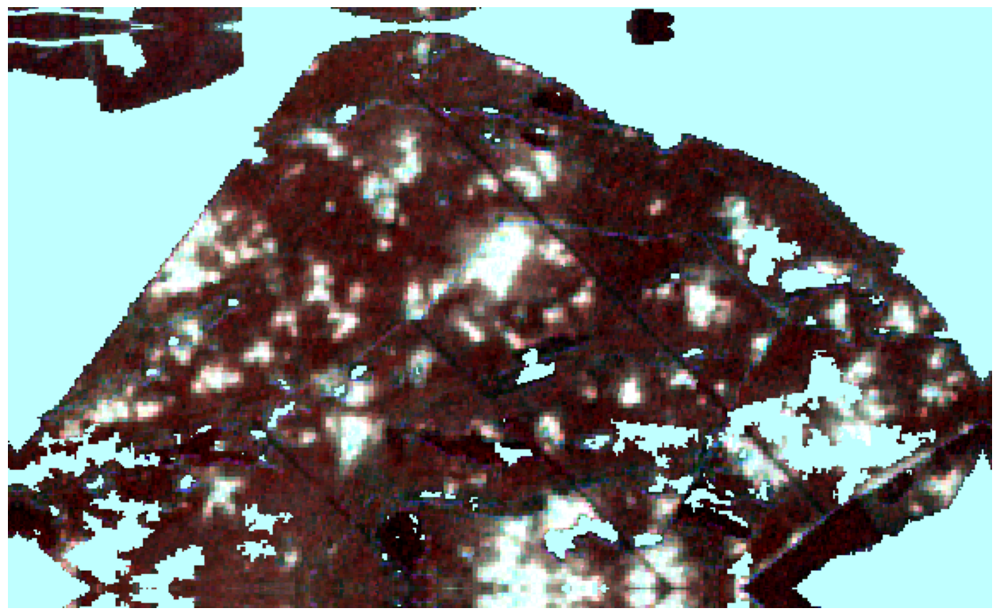

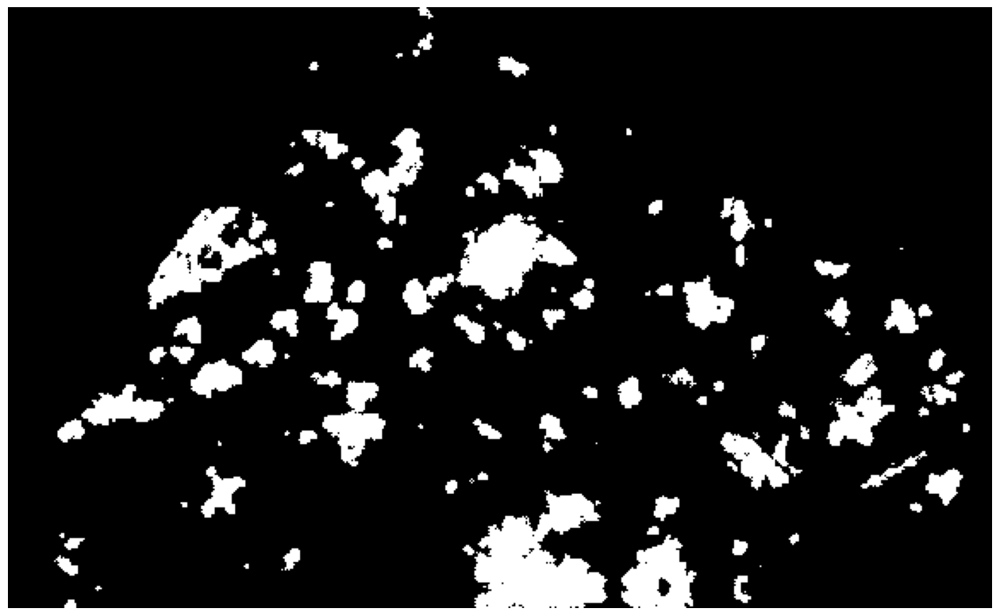

Processing file: img.tif
Number of tiles (x, y): 1, 1
X: 0 Y: 0


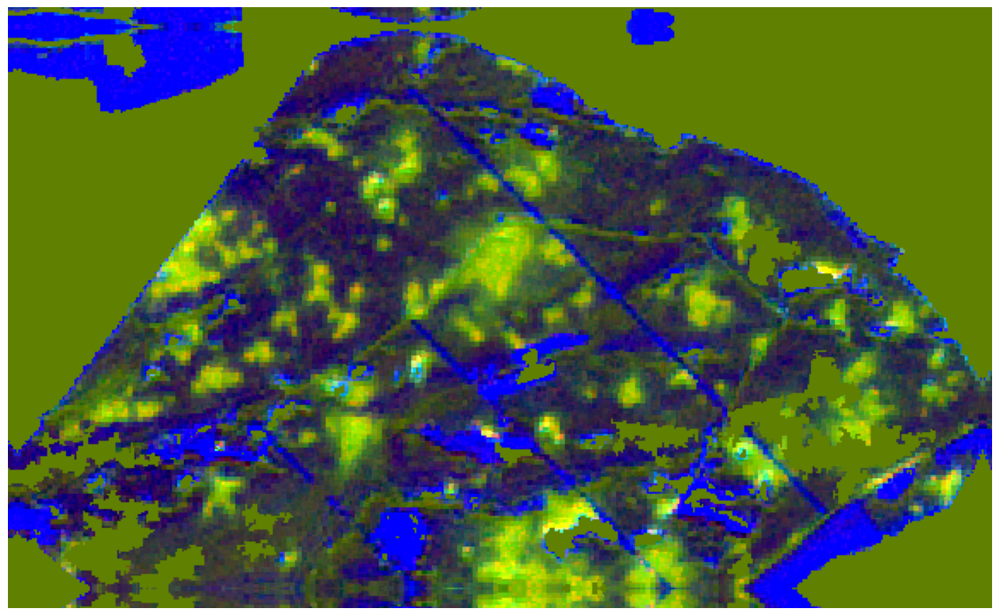

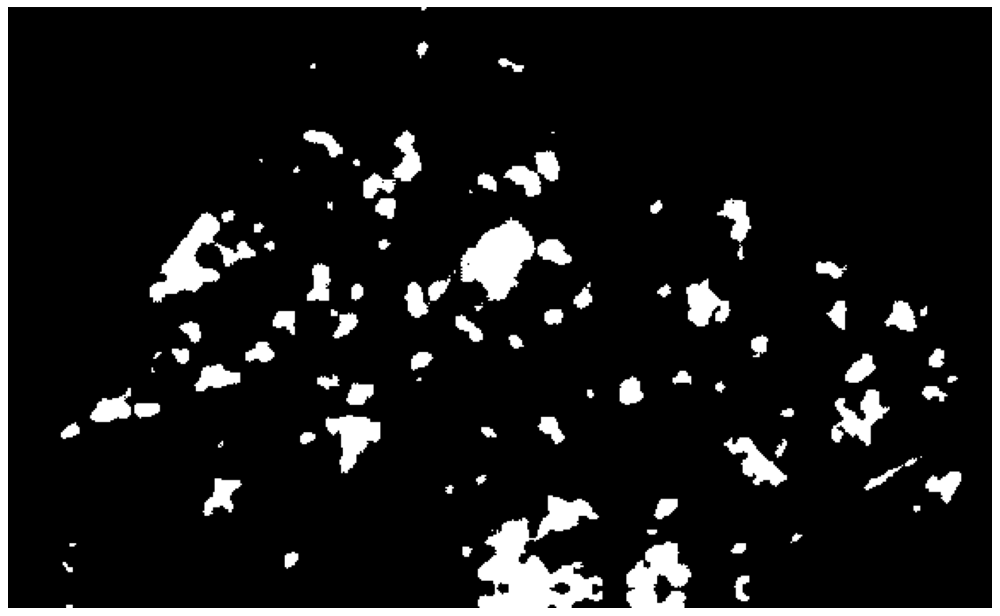

Processing file: img.tif
Number of tiles (x, y): 1, 1
X: 0 Y: 0


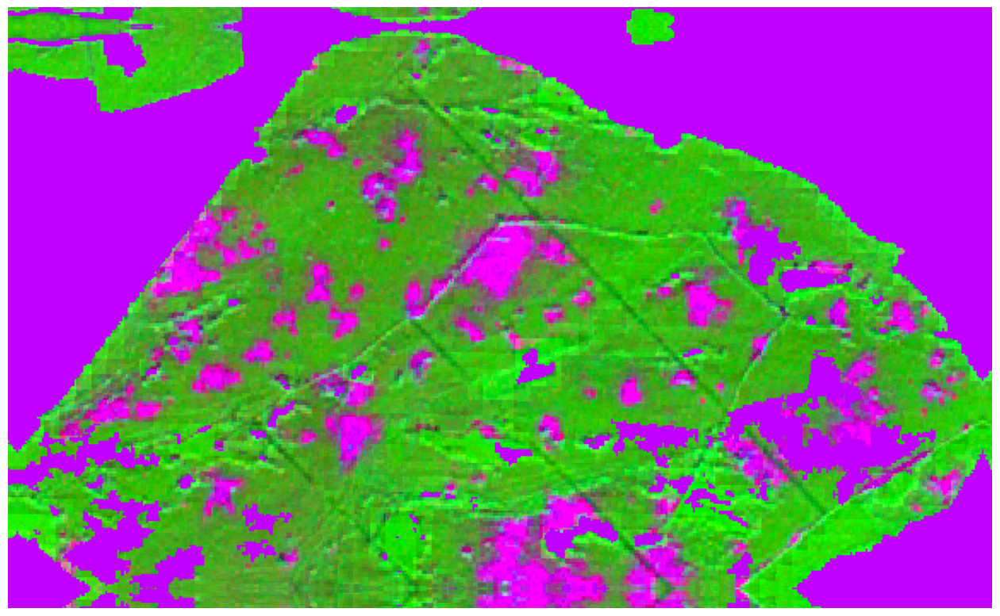

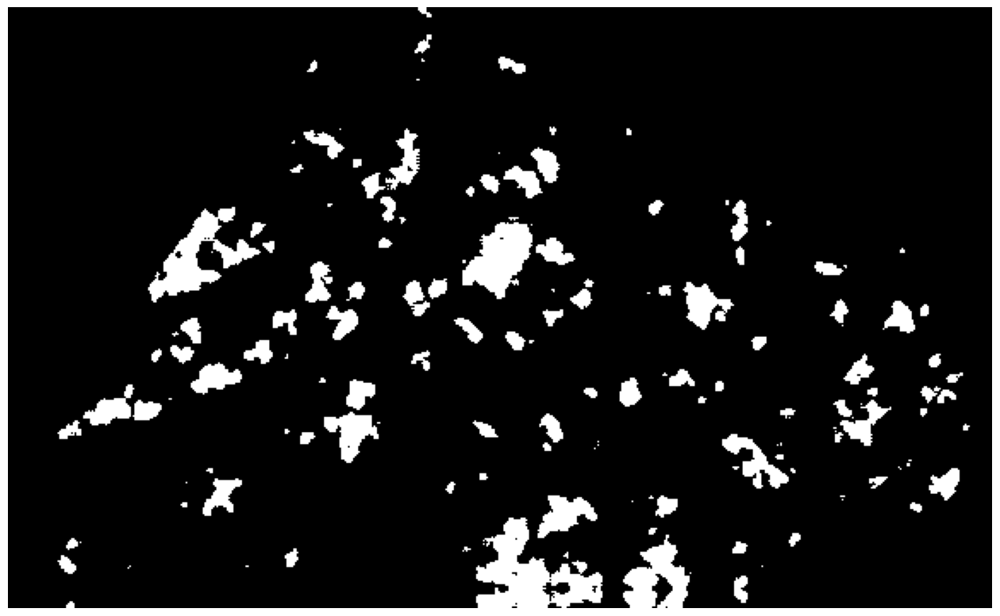

Processing file: img.tif
Number of tiles (x, y): 1, 1
X: 0 Y: 0


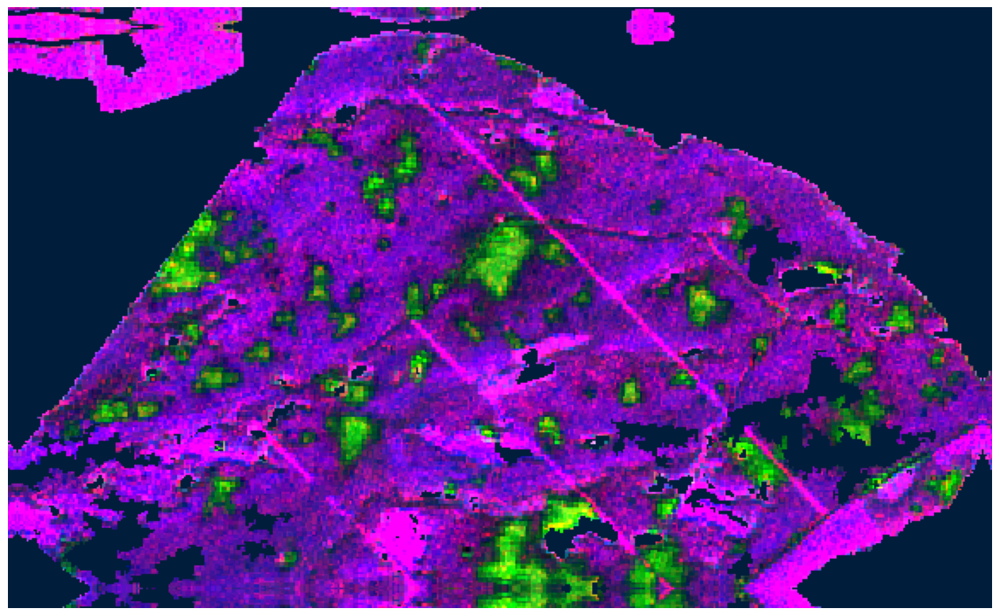

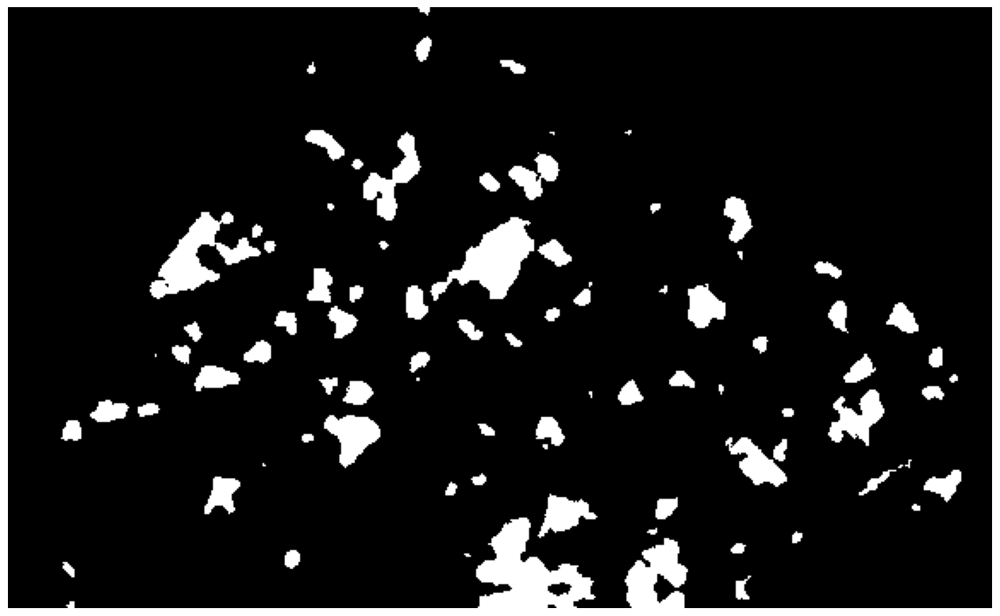

Processing file: img.tif
Number of tiles (x, y): 1, 1
X: 0 Y: 0


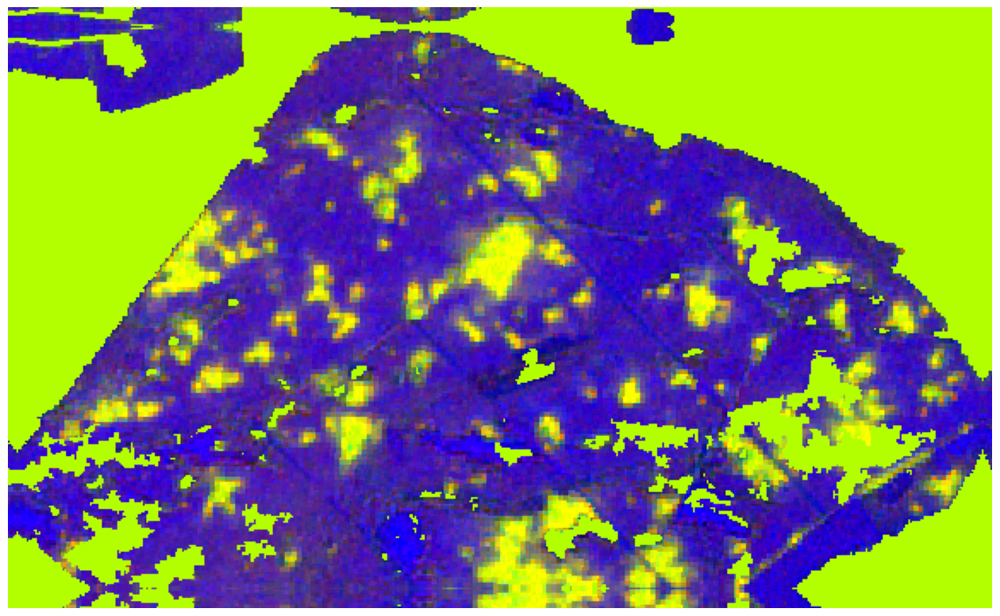

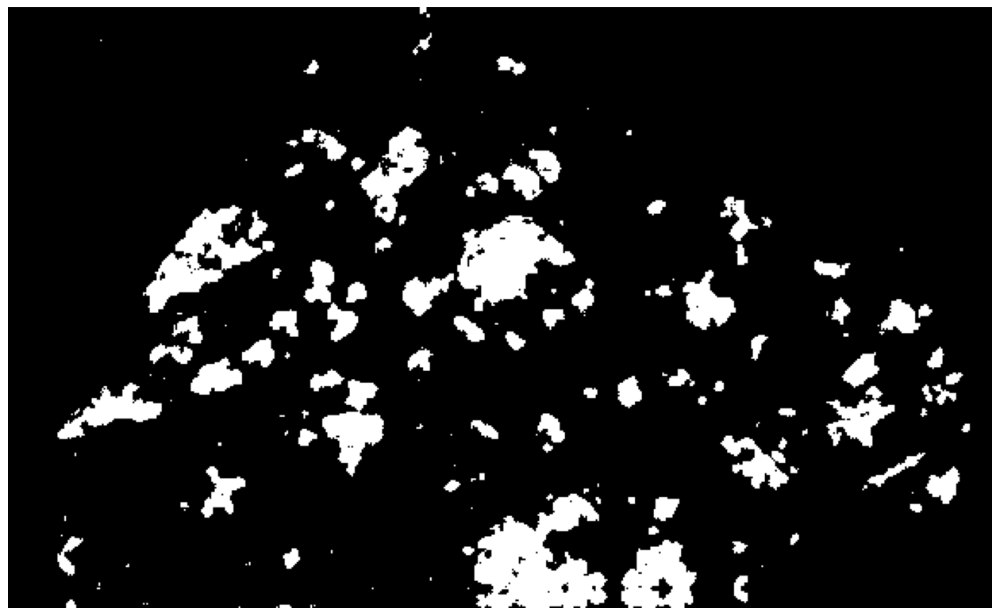

Processing file: img.tif
Number of tiles (x, y): 1, 1
X: 0 Y: 0


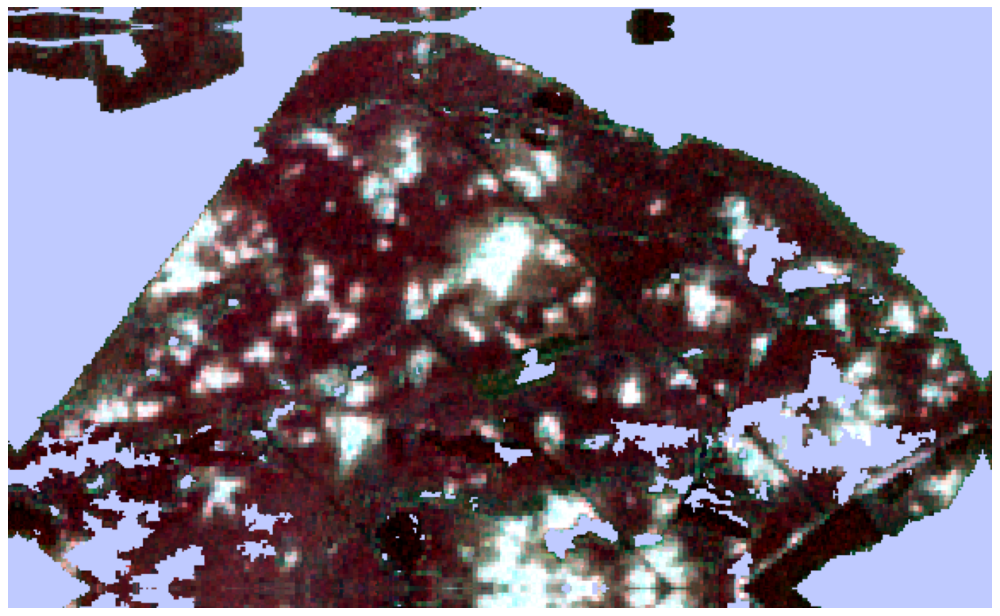

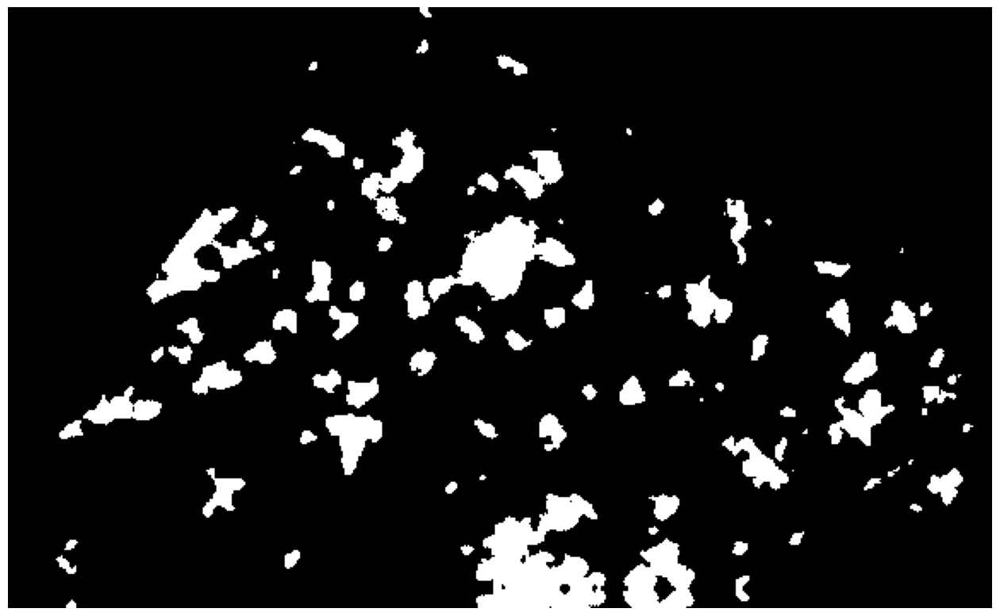

Processing file: img.tif
Number of tiles (x, y): 1, 1
X: 0 Y: 0


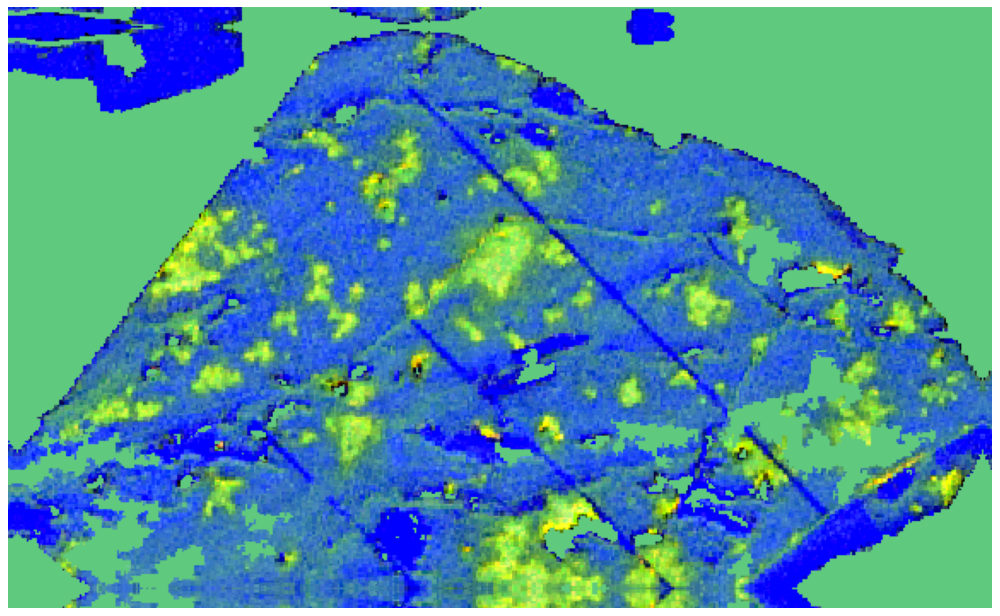

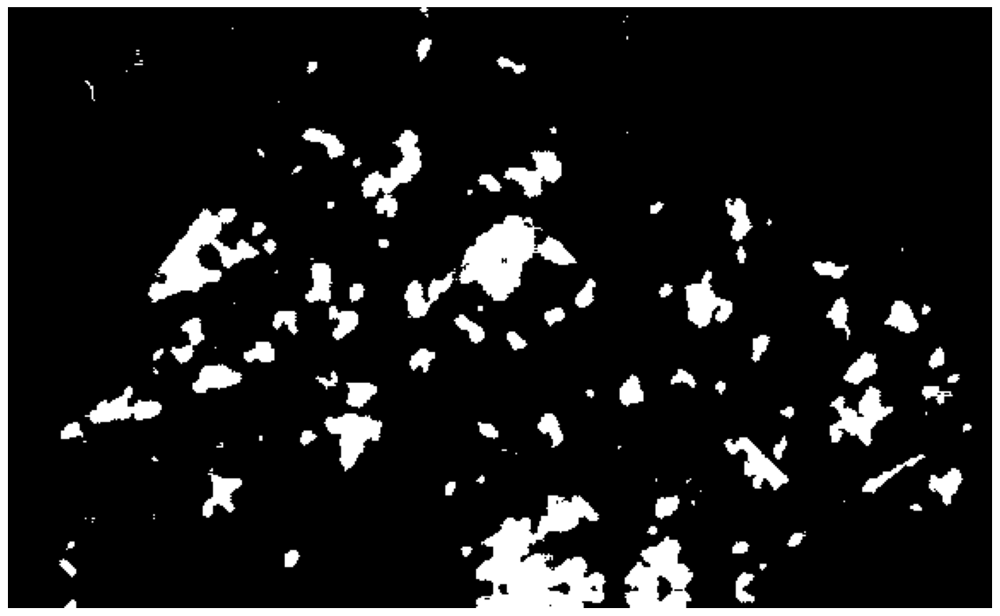

Processing file: img.tif
Number of tiles (x, y): 1, 1
X: 0 Y: 0


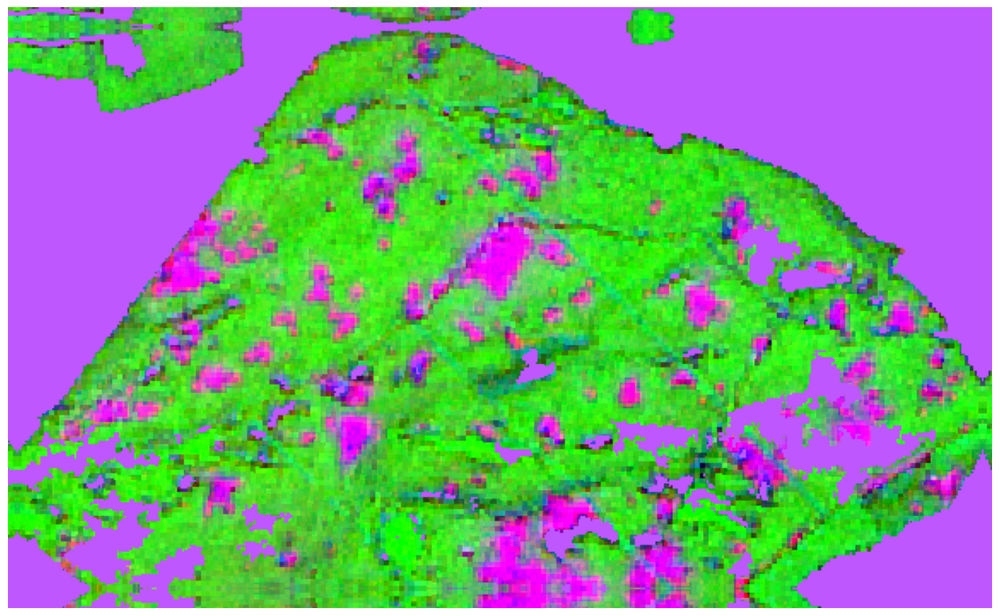

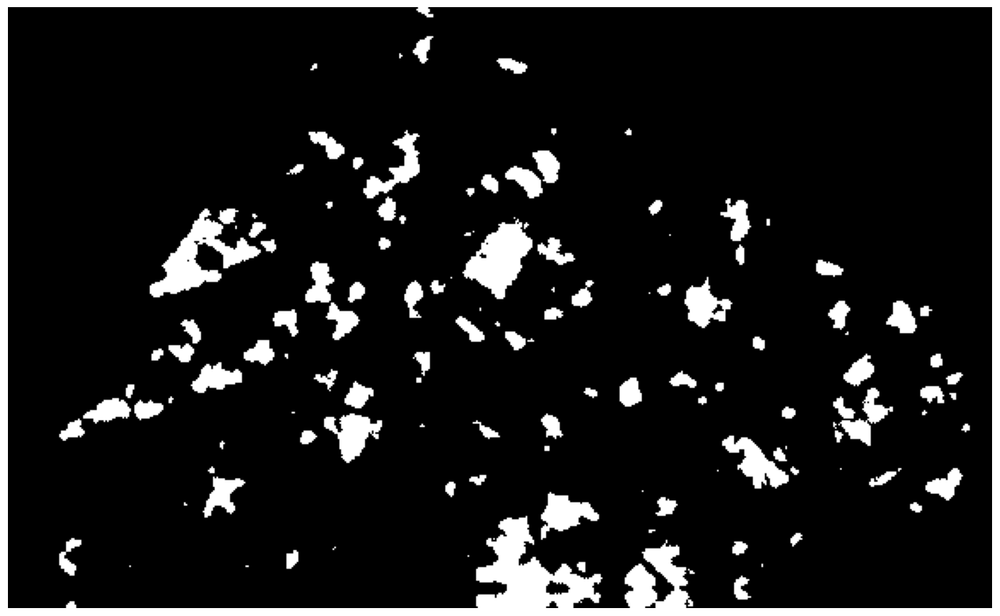

Processing file: img.tif
Number of tiles (x, y): 1, 1
X: 0 Y: 0


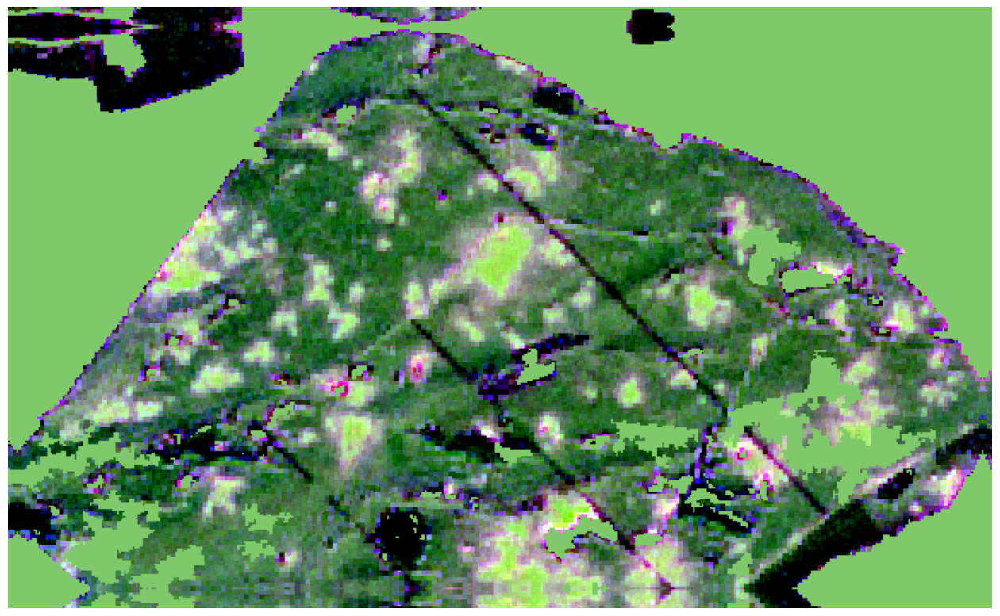

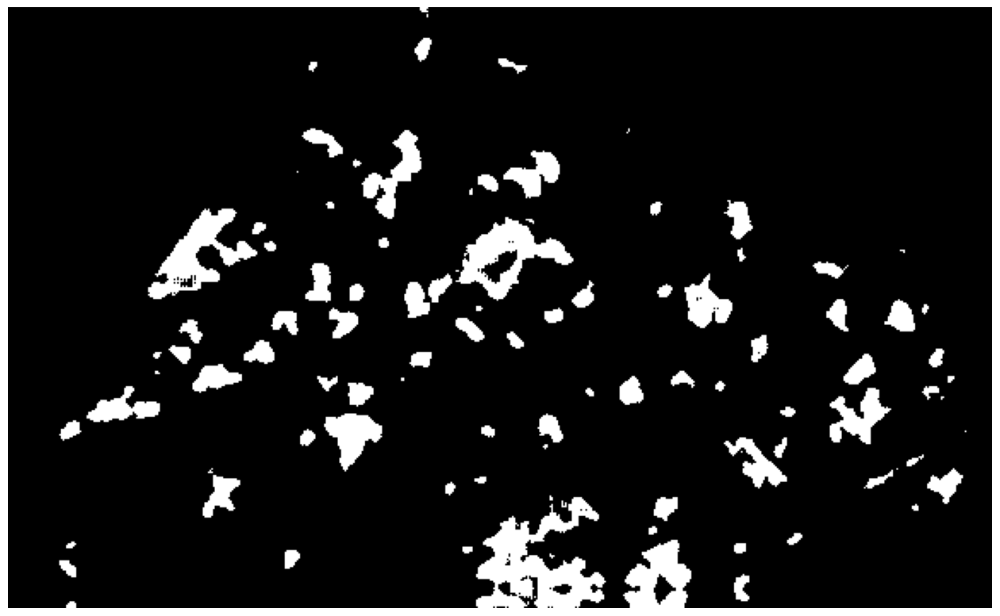

Processing file: img.tif
Number of tiles (x, y): 1, 1
X: 0 Y: 0


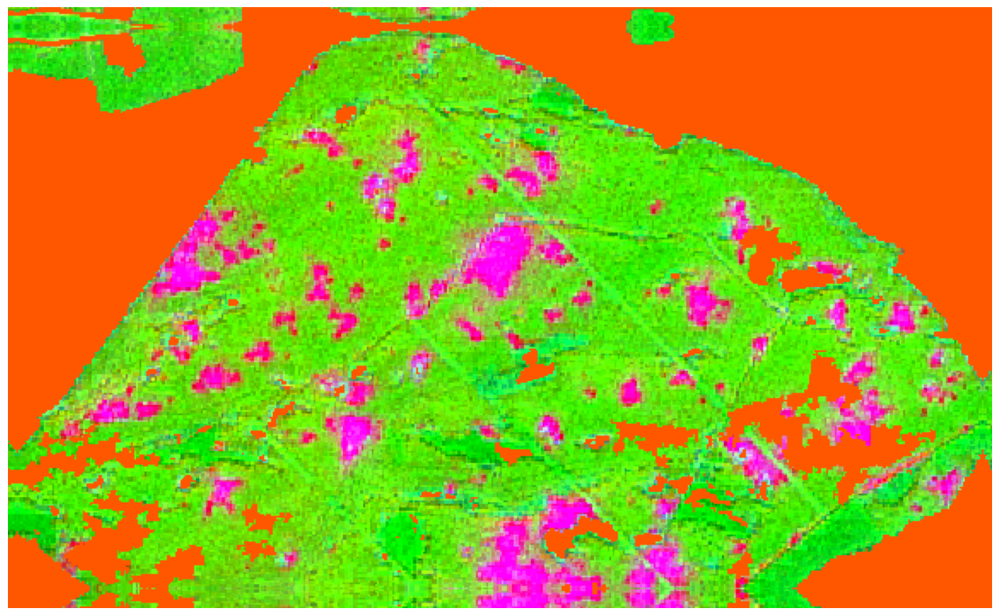

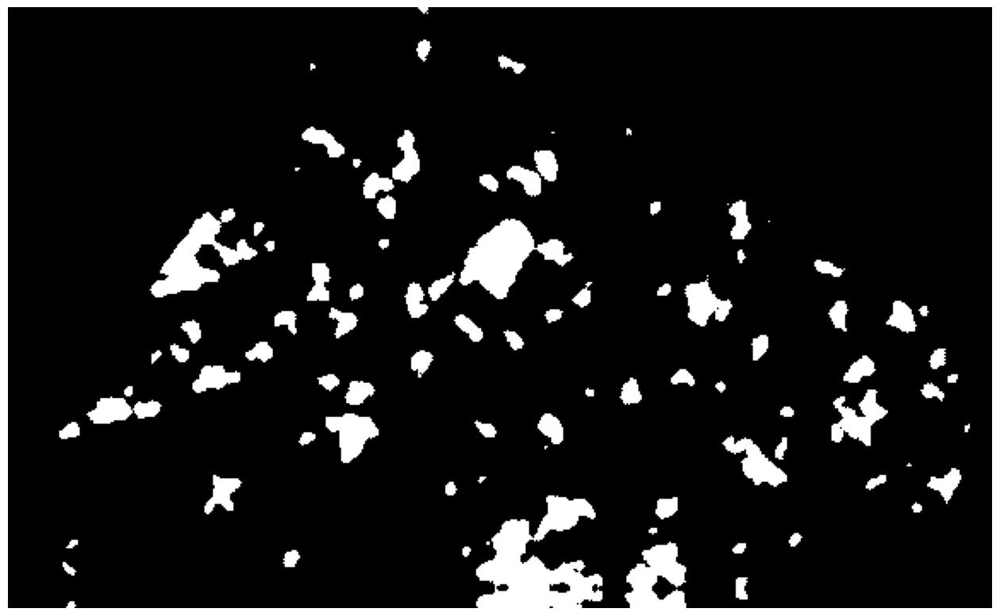

Processing file: img.tif
Number of tiles (x, y): 1, 1
X: 0 Y: 0


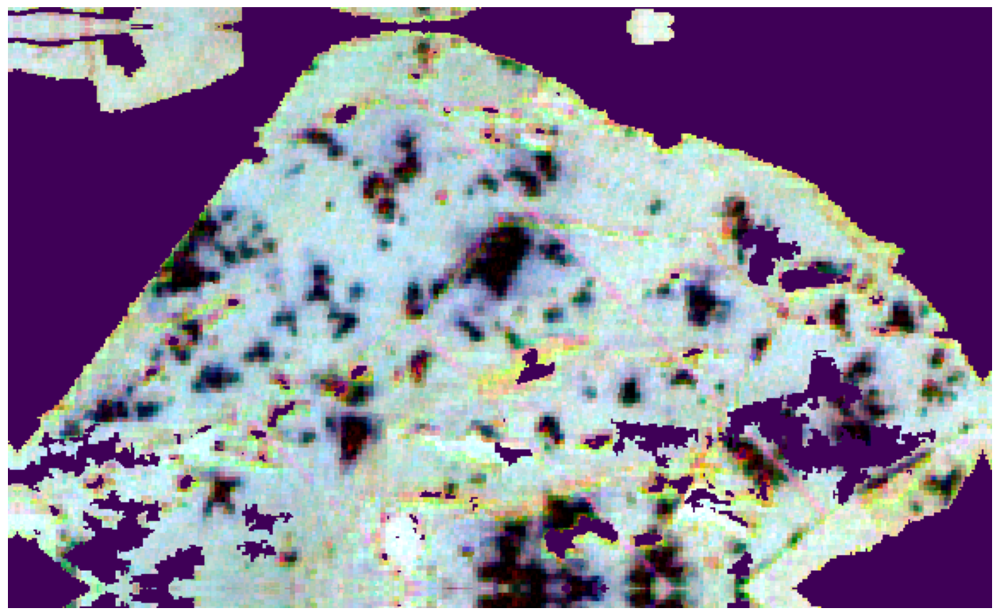

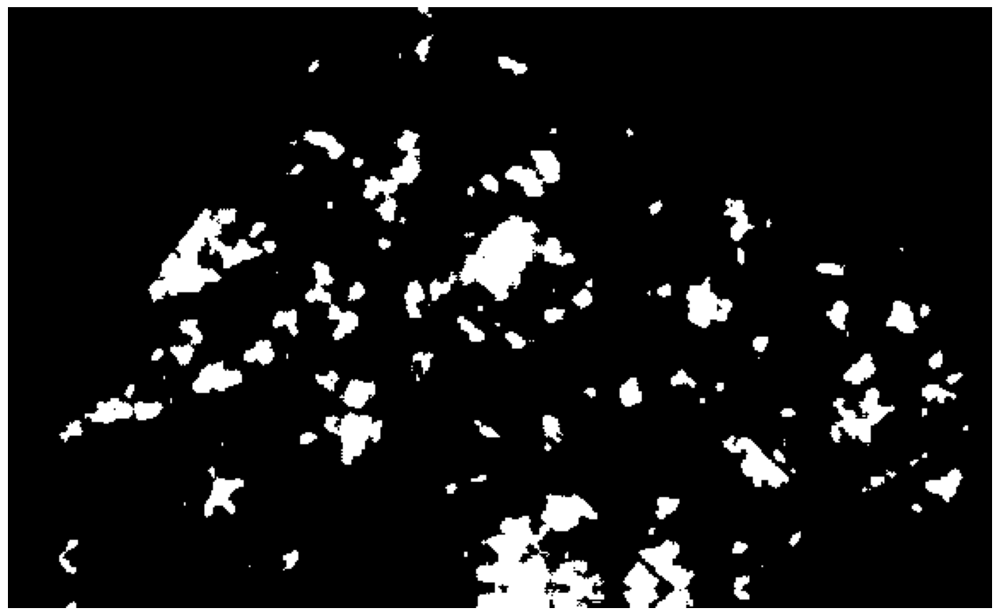

Processing file: img.tif
Number of tiles (x, y): 1, 1
X: 0 Y: 0


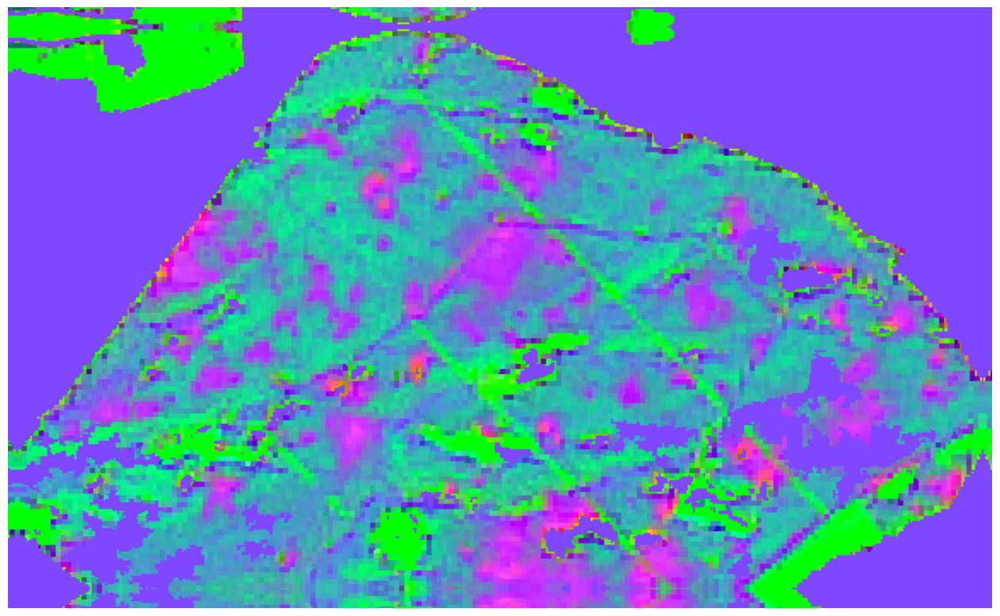

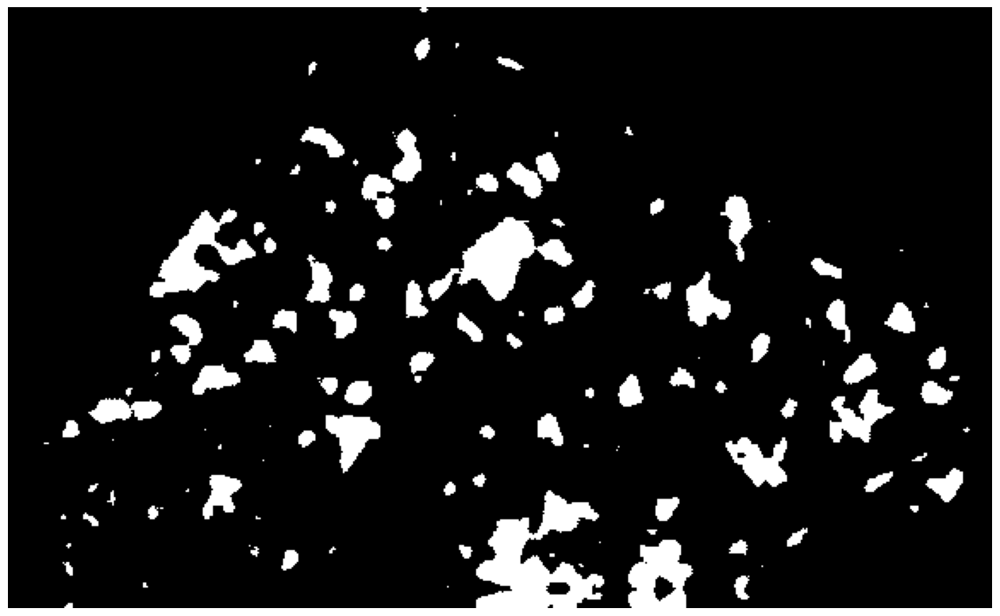

Processing file: img.tif
Number of tiles (x, y): 1, 1
X: 0 Y: 0


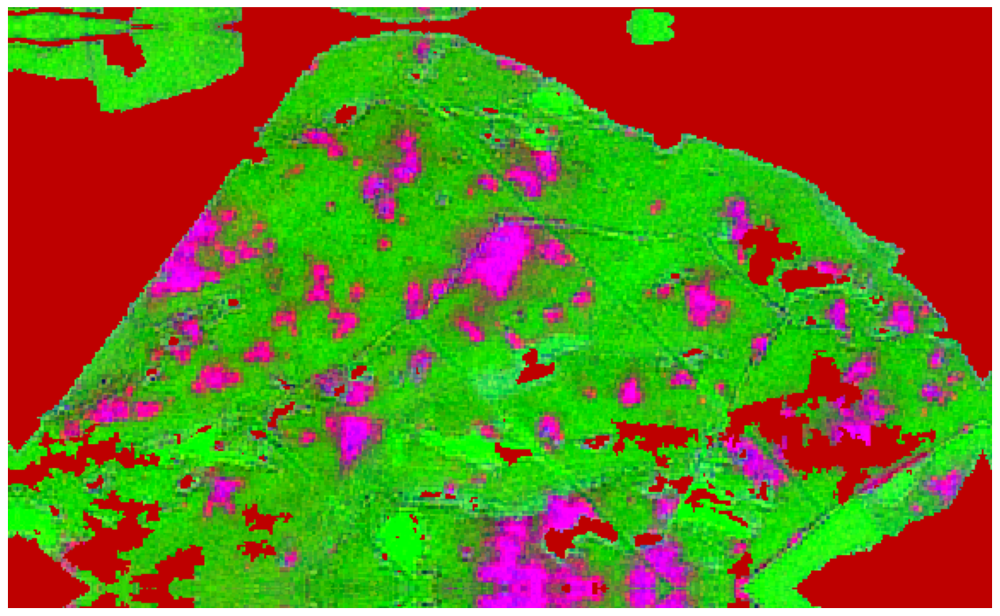

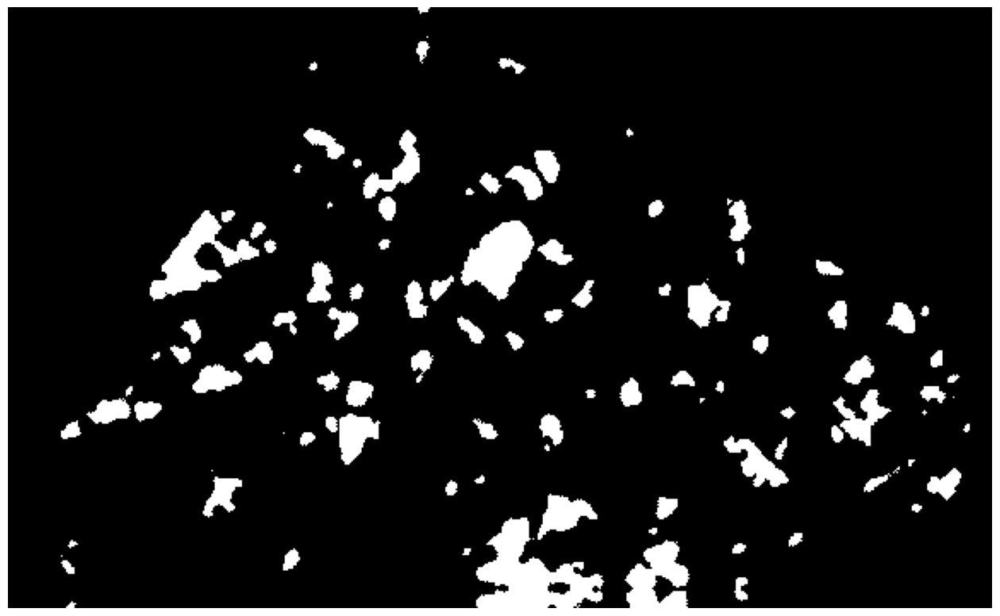

In [10]:
import importlib.util
for key in models_dict.keys():
  model_name = key
  model_p = models_dict[model_name]

  chk_path = model_p["path"]
  model_best = SARModel.load_from_checkpoint(chk_path)
  image_dir = working_folder_root + r'\test_images'
  output_dir = 'output'

  spec = importlib.util.spec_from_file_location("vv2rgb", os.path.join(working_folder_root, 'vv2rgb', f"{model_name}.py"))

  vv2rgb = importlib.util.module_from_spec(spec)
  spec.loader.exec_module(vv2rgb)
                  
  NODATA_COLOR = vv2rgb.NODATA_RGB
  CONST_NORM = A.Normalize(mean=vv2rgb.NORM_MEAN, std=vv2rgb.NORM_STD, max_pixel_value=255.0, p=1.0)

  def convert_db_norm(folder, file, show_plot=False):
      s2_ds = gdal.Open(os.path.join(folder, file))
      ft_ds = gdal.Open(os.path.join(folder, file.split('.')[0] + '.ftype' + ".tif"))
      gt_ds = gdal.Open(os.path.join(folder, file.split('.')[0] + '.label' + ".tif"))

      ft = ft_ds.GetRasterBand(1).ReadAsArray()

      s2 = np.empty((s2_ds.RasterYSize, s2_ds.RasterXSize, s2_ds.RasterCount))
      for i in range(s2.shape[2]):
          s2[:, :, i] = s2_ds.GetRasterBand(i + 1).ReadAsArray()
      
      s2[ft != 2, :] = 0
      rgb = vv2rgb.convert(s2)

      if show_plot is True:
          plt.imshow(rgb)
          plt.show()

      return rgb, gt_ds.GetRasterBand(1).ReadAsArray()

  os.makedirs(output_dir, exist_ok=True)

  listdir = os.listdir(image_dir)
  listdir = sorted(listdir, reverse=True)

  for file_name in listdir:
    if len(file_name.split(".")) > 2:
      continue

    print(f"Processing file: {file_name}")
    converted, ground_truth = convert_db_norm(image_dir, file_name)

    divisor = 32

    image_width_padded = converted.shape[1]
    if converted.shape[1] % divisor != 0:
      image_width_padded += divisor - converted.shape[1] % divisor

    image_height_padded = converted.shape[0]
    if converted.shape[0] % divisor != 0:
      image_height_padded += divisor - converted.shape[0] % divisor

    transforms = A.Compose([
        A.augmentations.geometric.transforms.PadIfNeeded(min_height=image_height_padded, min_width=image_width_padded),
        CONST_NORM
        ])

    predict_tensor = torch.empty((1, image_height_padded, image_width_padded), dtype=torch.int8)
    input_tensor = converted
    input_tensor = transforms(image=input_tensor)['image']

    input_tensor = input_tensor.swapaxes(0, 2).swapaxes(1, 2)
    input_tensor = input_tensor.reshape(1, 3, image_height_padded, image_width_padded)
    input_tensor = torch.from_numpy(input_tensor).cuda()


    chunk_size = 1280
    tiles_y = int(np.ceil(input_tensor.shape[2]/chunk_size))
    tiles_x = int(np.ceil(input_tensor.shape[3]/chunk_size))

    print(f"Number of tiles (x, y): {tiles_x}, {tiles_y}")
    for x in range(tiles_x):
      for y in range(tiles_y):
        print(f"X: {x} Y: {y}")
        begin_x = x * chunk_size
        end_x = begin_x + np.min([chunk_size, input_tensor.shape[3] - begin_x])

        begin_y = y * chunk_size
        end_y = begin_y + np.min([chunk_size, input_tensor.shape[2] - begin_y])

        with torch.no_grad():
            model_best.eval()
            logits_best = model_best(input_tensor[:, :, begin_y:end_y, begin_x:end_x]).cuda()
        pred_masks = logits_best.sigmoid()
        pred_masks = (pred_masks > 0.5).int()

        predict_tensor[0, begin_y:end_y, begin_x:end_x] = pred_masks.squeeze()

      

      subplots_count = 2

      plt.figure(figsize=(16, 16))
      # plt.subplot(subplots_count, 1, 1)
      plt.imshow(cv2.normalize(input_tensor[0,:,:,:].permute(1, 2, 0).cpu().numpy(), None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U))  # convert CHW -> HWC
      # plt.title("Image")
      plt.axis("off")
      plt.savefig( os.path.join(working_folder_root, "media", model_name + ".preproc.png"),bbox_inches='tight', transparent="True", pad_inches=0)

      plt.figure(figsize=(16, 16))
      # plt.subplot(subplots_count, 1, 2)
      plt.imshow(predict_tensor[0, :, :], cmap="gray") # just squeeze classes dim, because we have only one class
      # plt.title("Prediction")
      plt.axis("off")
      plt.savefig( os.path.join(working_folder_root, "media", model_name + ".predict.png"),bbox_inches='tight', transparent="True", pad_inches=0)

      plt.show()

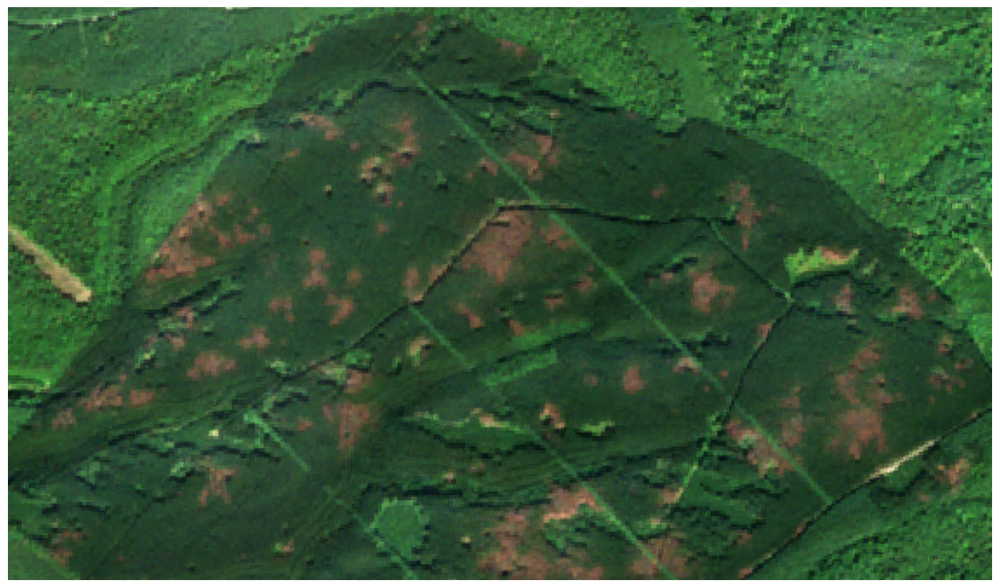

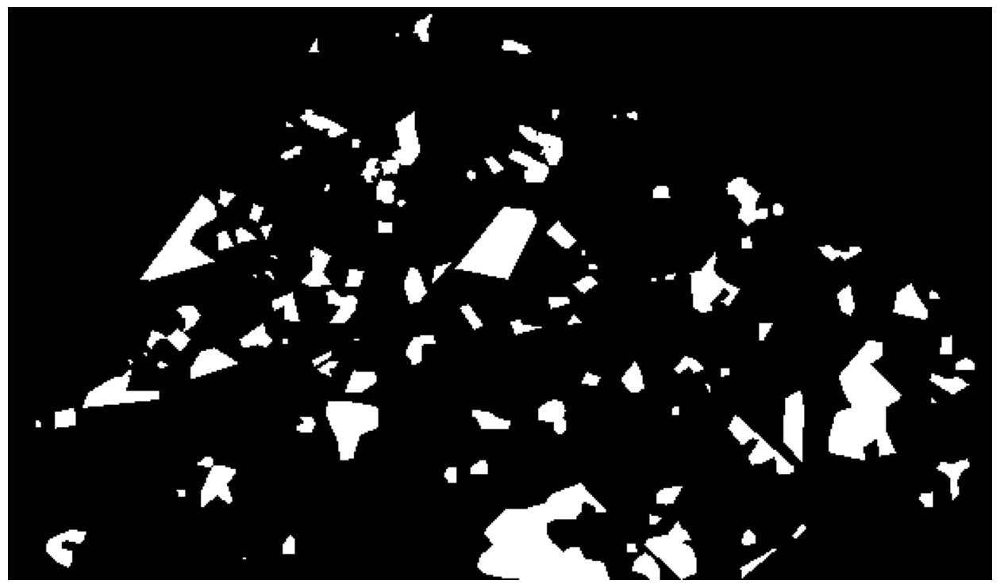

In [11]:
model_name = "rgb"

s2_ds = gdal.Open(os.path.join(working_folder_root, "test_images", "img.tif"))
ft_ds = gdal.Open(os.path.join(working_folder_root, "test_images", "img.ftype.tif"))

image = np.empty((s2_ds.RasterYSize, s2_ds.RasterXSize, 3))
image[:, :, 0] = s2_ds.GetRasterBand(4).ReadAsArray()
image[:, :, 1] = s2_ds.GetRasterBand(3).ReadAsArray()
image[:, :, 2] = s2_ds.GetRasterBand(2).ReadAsArray()

plt.figure(figsize=(16, 16))
# plt.subplot(subplots_count, 1, 1)
plt.imshow(cv2.normalize(image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U))  # convert CHW -> HWC
# plt.title("Image")
plt.axis("off")
plt.savefig( os.path.join(working_folder_root, "media", model_name + ".preproc.png"),bbox_inches='tight', transparent="True", pad_inches=0)

plt.figure(figsize=(16, 16))
# plt.subplot(subplots_count, 1, 2)
plt.imshow(ground_truth, cmap="gray") # just squeeze classes dim, because we have only one class
# plt.title("Prediction")
plt.axis("off")
plt.savefig( os.path.join(working_folder_root, "media", model_name + ".predict.png"),bbox_inches='tight', transparent="True", pad_inches=0)

plt.show()